# Анализ московской сети общепита

## Описание проекта

### Цели и задачи

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Задача - подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места. Также необходимо предоставить более детальное исследование на случай открытия именно кофейни.

### Описание данных

**moscow_places.csv** - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках, носит исключительно справочный характер.


* name — название заведения;
* address — адрес заведения;
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
* hours — информация о днях и часах работы;
* lat — широта географической точки, в которой находится заведение;
* lng — долгота географической точки, в которой находится заведение;
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки)
* district — административный район, в котором находится заведение, например Центральный административный округ;
* seats — количество посадочных мест.

## Чтение и предобработка данных:

### Чтение данных

Импортируем библиотеки и **прочтём данные**:

In [1]:
# импорт библиотек

import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
from plotly import graph_objects as go 
from numpy import median
import json
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [2]:
# чтение данных
data = pd.read_csv('/datasets/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


### Соответствие данных типам

Проверим на **соответствие типам данных**:

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Типы данных соответствуют ожидаемым. 

Для дальнейшего анализа необходимо учитывать, что столбец с численным значением среднего чека заполнен для менее чем половины заведений, для меньшей части заведений подобные данные заполнены в столбце со средней стоимостью капучино. Остальные данные о ценах там, где они заполнены, содержатся в строковом виде.

### Проверка на пропуски

Проверим на **пропуски**:

In [4]:
data_na_sum = pd.DataFrame(data.isna().sum(), columns=['na_sum'])
data_na_sum['na_percent'] = round(data_na_sum['na_sum'] * 100 / len(data), 2)
data_na_sum.sort_values(by='na_sum', ascending=False).style.background_gradient(cmap ="coolwarm")

,na_sum,na_percent
middle_coffee_cup,7871,93.640000
middle_avg_bill,5257,62.540000
price,5091,60.560000
avg_bill,4590,54.600000
seats,3611,42.960000
hours,536,6.380000
name,0,0.000000
category,0,0.000000
address,0,0.000000
district,0,0.000000


Информация о днях и часах работы не заполнена в 6.38% строк.

Количество посадочных мест не заполнено в 42.96% строк.

Категория цен - 60.56% пропусков.

Средняя стоимость заказа - 54.6% пропусков, производные от неё столбцы middle_avg_bill и middle_coffee_cup - 62.54% и 93.64% пропусков, соответственно.

Удаление строк с пропущенными значениями ввиду их большого количества, как и заполнение синтетическими данными, нецелесообразно, оставляем как есть и учитываем наличие пропусков в дальнешем анализе. 

### Проверка на дубликаты

Проверим на **явные дубликаты**:

In [5]:
data.duplicated().sum()

0

Явных дубликатов не обнаружено

Посмотрим, сколько всего заведений сдержится в данных и сколько **уникальных названий заведений**:

In [6]:
print('Всего заведений:', len(data))
print('Уникальных названий заведений:', len(data.name.unique()))

Всего заведений: 8406
Уникальных названий заведений: 5614


Выведем количество заведений с одинаковыми названиями, не являющиеся сетями:

In [7]:
len(data.query('chain == 0 and name.duplicated()'))

349

Выведем названия таких заведений и количество точек для каждого из них:

In [8]:
# список неуникальных названий, не являющиеся сетями
non_unique_names = data.query('chain == 0 and name.duplicated()')['name'].unique()

# вывод количества заведений
data.query('name in @non_unique_names')['name'].value_counts()

Кафе                 189
Шаурма                43
Ресторан              34
Столовая              28
Бистро                12
Кофейня               12
Кафе-столовая          9
Буфет                  8
Трапезная              7
Шашлычная              6
Поминальные обеды      5
Пиццерия               3
Блины                  3
Кафе для поминок       2
Кафе-кулинария         2
Чебуречная             2
Name: name, dtype: int64

Похоже на то, что эти названия не являются названиями сетей и заведения с ними дейсвительно не связаны между собой.

Проверим обратную ситуацию: есть ли в данных сети с одним заведением. В описании данных указано, что для маленьких сетей в столбце **chain** могут встречаться ошибки. 

In [9]:
# список названий сетей
chain_names = data.query('chain == 1')['name'].unique()
#сети с одним заведением
chain_non_chain = (pd.DataFrame(data.query('name in @chain_names')
                       .groupby('name')['name']
                       .count())
          .query('name == 1'))
# вывод количества сетей с одним заведением
print('Сети с одим заведением:', len(chain_non_chain))

Сети с одим заведением: 64


Посмотрим, что это за заведения:

In [10]:
chain_non_chain.index

Index(['1-я Креветочная', '4 Сезона', 'Bakery', 'BigСуши', 'Deli2Go', 'Drive',
       'Easy Pizza', 'Halal food', 'Home', 'Kimpab', 'Ploveberry', 'Ricers',
       'SUШi', 'Tasty Thai', 'Vintage', 'Wаурма', 'Zafferano',
       'Бакинский дворик', 'Баку', 'Барбарис', 'Бюро Пиццы', 'В своей тарелке',
       'Виолино', 'Городок', 'Даблби', 'Дайнинг Холл', 'Дастархан', 'Диана',
       'Донер хаус', 'Кинобар', 'Китчен', 'Кофе пью', 'Кофейник', 'Крепери',
       'Лагман', 'Ливан Хаус', 'Любовь и Сладости', 'Миндаль', 'МореМоре',
       'Мясо на углях', 'Парк', 'Пекарня № 1', 'Пивбар', 'Пицца экспресс',
       'Поминальная трапеза', 'Прованс', 'Радуга', 'Роллофф', 'Рома', 'Сириус',
       'Сказка', 'Суши Wok', 'Суши Таун', 'Суши-Пицца 312', 'Уйгурский лагман',
       'Харчевниковъ', 'Хинкали', 'Хинкальная Экспресс', 'Чабан Чуду', 'Чай',
       'Чайхана Хан', 'Чайхана-24', 'Чао-пицца', 'Шашлыки'],
      dtype='object', name='name')

На первый взгляд эти заведения действительно не являются сетевыми. Исправим это в датасете:

In [11]:
data.loc[data['name'].isin(chain_non_chain.index), 'chain'] = 0

### Создание столбца **street**

Создадим столбец **street** с названиями улиц из столбца с адресом.

In [12]:
data['street'] = data.address.str.split(",", expand=True)[1]
data['street'].head()

0               улица Дыбенко
1               улица Дыбенко
2          Клязьминская улица
3     улица Маршала Федоренко
4         Правобережная улица
Name: street, dtype: object

### Создание столбца **is_24_7**

Создадим столбец **is_24_7** с обозначением, что заведение работает ежедневно и круглосуточно (24/7):

логическое значение True — если заведение работает ежедневно и круглосуточно;

логическое значение False — в противоположном случае.

In [14]:
# для строк, содержащих "ежедневно, круглосуточно" указываем значение True, 
# для содержащих иные значения - False
data['is_24_7'] = data['hours'].str.contains('ежедневно, круглосуточно')

# для пропусков - значение False
data['is_24_7'] = data['is_24_7'].fillna(False)

### **Выводы** этапа предобработки

1. Явных дубликатов в датасете не обнаружено, данные соответствуют ожидаемым типам. 

2. В датасете 8406 заведений. Уникальных названий заведений: 5614

3. Обнаружены 349 заведений с повторяющимися неперсонифицированными названиями вроде "Кафе", "Шаурма", "Ресторан". Данные заведения правильным образом не помечены в датасете как сеть.

4. В датасете присутствовали 64 заведения, имеющие всего одно заведение и помеченные как сеть. В целях исследования их статус в датасете был изменён на не сетевой.

5. В датасете присутствовали пропуски:

-Информация о днях и часах работы не заполнена в 6.38% строк.

-Количество посадочных мест не заполнено в 42.96% строк.

-Категория цен - 60.56% пропусков.

-Средняя стоимость заказа - 54.6% пропусков, производные от неё столбцы middle_avg_bill и middle_coffee_cup - 62.54% и 93.64% пропусков, соответственно.

Поскольку удаление строк с пропущенными значениями ввиду их большого количества, как и заполнение синтетическими данными, нецелесообразно, оставили их как есть и будем учитывать это в дальнешем анализе. 

6. В целях исследоваия были созданы столбец **street** с названиями улиц, столбец **is_24/7** со значением True для заведений, работающих ежедневно и круглосуточно.

7. Для дальнейшего анализа необходимо учитывать, что столбец с численным значением среднего чека заполнен для менее чем половины заведений, для меньшей части заведений подобные данные заполнены в столбце со средней стоимостью капучино. Остальные данные о ценах там, где они заполнены, содержатся в строковом виде.

## Анализ данных

### Категории заведений

In [15]:
category_names = data.groupby('category')['name'].count()

Выведем количество заведений по категориям:

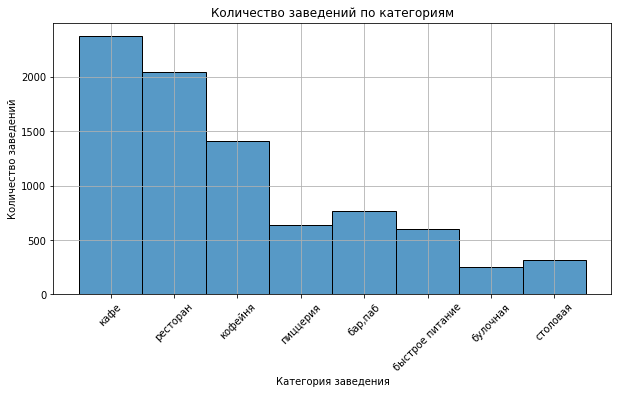

In [16]:
plt.figure(figsize=(10,5))
sns.histplot(data['category'])
sns.set_style("whitegrid")
plt.title('Количество заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

Наиболее многочисленные категории заведений - кафе и рестораны (более 2000 заведений каждой категории), а также кофейни (почти 1500 заведений). 

Пиццерии, бары и точки быстрого питания - немногим более чем по 500 заведений. 

Столовых и булочных в Москве меньше всего - менее чем по 300 заведений.

### Количество посадочных мест

Исследуем количество посадочных мест в заведениях различных категорий:

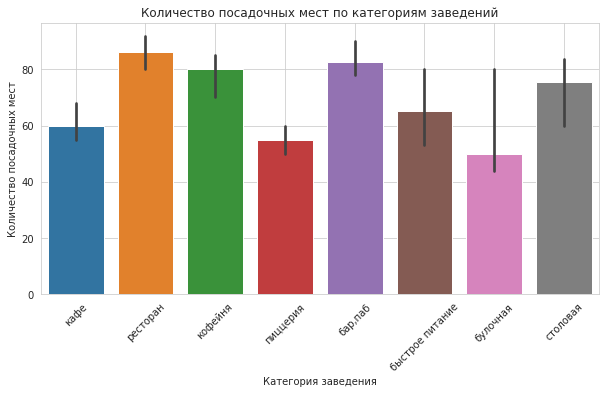

In [17]:
plt.figure(figsize=(10,5))
sns.barplot(x='category', y='seats', data=data, estimator=median)
plt.title('Количество посадочных мест по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

Бары, кофейни и  рестораны как правило обладают наибольшим количеством посадочных мест, медиана более 80 мест на заведение. 

Наименьшее количество посадочных мест у пиццерий и булочных, медианное значение посадочных мест около 50. 

У булочных в то же время наибольший разброс по посадочным местам.

### Сетевые и несетевые заведения

Рассмотрим соотношение сетевых и несетевых заведений в датасете:

In [18]:
fig_is_chain = go.Figure(data=[go.Pie(labels=['Сетевые', 'Несетевые'], 
                                   values=[len(data.query('chain==1')), len(data.query('chain==0'))])])
fig_is_chain.update_layout(title='Соотношение сетевых и несетевых заведений')
fig_is_chain.show() 

Почти две трети заведений - несетевые.

Ответим на вопрос, какие категории заведений чаще являются сетевыми.

In [19]:
# таблица с количеством сетевых заведений по категориям 
chain_cat = data.query('chain == 1').groupby('category')['name'].count()

# визуализация
fig_chain_cat = go.Figure(data=[go.Pie(labels=chain_cat.index, values=chain_cat)])
fig_chain_cat.update_layout(title='Категории сетевых заведений')
fig_chain_cat.show() 

Кафе, рестораны, и кофейни - вместе более трети от всех сетевых заведений, представлены среди них примерно одинаково. 10% сетевых заведений - пиццерии, чуть более 7% - заведения быстрого питания, остальные категории реже представлены среди сетевых.

### Топ-15 сетей

Найдём топ-15 сетей по количеству заведений в Москве.

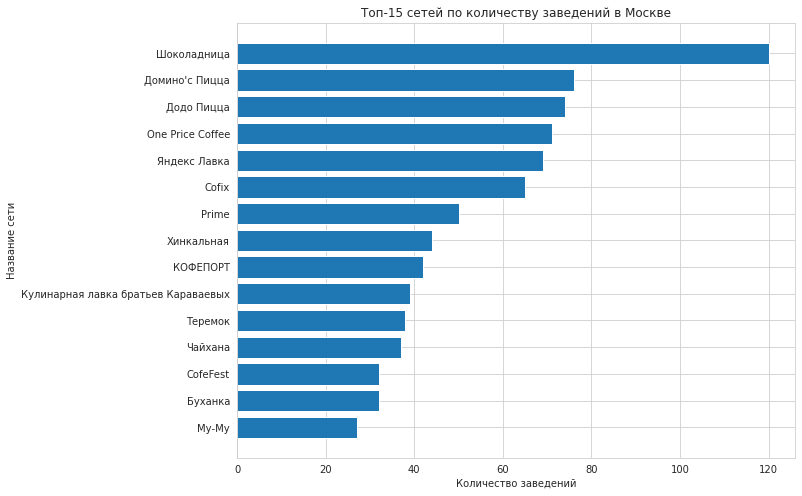

In [20]:
top_chains = pd.DataFrame(data.query('chain==1')
                          .groupby('name')['name']
                          .count()
                          .sort_values(ascending=False)
                          .head(15)
                          .sort_values(ascending=True))
top_chains.columns=['count']

plt.figure(figsize=(10,8))
plt.barh(top_chains.index, top_chains['count'])
plt.title('Топ-15 сетей по количеству заведений в Москве')
plt.ylabel('Название сети')
plt.xlabel('Количество заведений')
plt.show()

Как видим, в топ-15 заведений попали сети с количеством заведений выше 25, больше всего точек (120) у сети "Шоколадница".

Выведем количество этих заведений по категориям в округах:

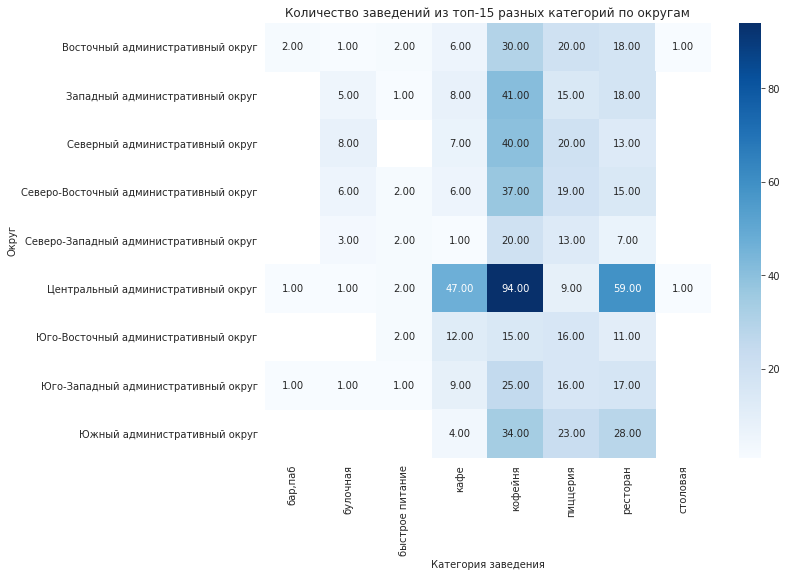

In [21]:
def show_heatmap (table, title, xlabel, ylabel, fmt='.2f'):
    plt.figure(figsize=(10,8))
    sns.heatmap(table, cmap='Blues', annot=True, fmt=fmt)
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.show()

cat_distr_count = data.query('name in @top_chains.index').pivot_table(index='district',
                                   columns='category',
                                   values='name',
                                   aggfunc='count')

show_heatmap(cat_distr_count,
             'Количество заведений из топ-15 разных категорий по округам',
             'Категория заведения',
             'Округ')

Самые крупные сети представлены в категориях кофеен, ресторанов, пиццерий и кафе, больше всего - в категории кофеен, Больше всего заведений в центральном округе.

### Распределение по округам

Отобразим общее количество заведений каждой категории по районам.

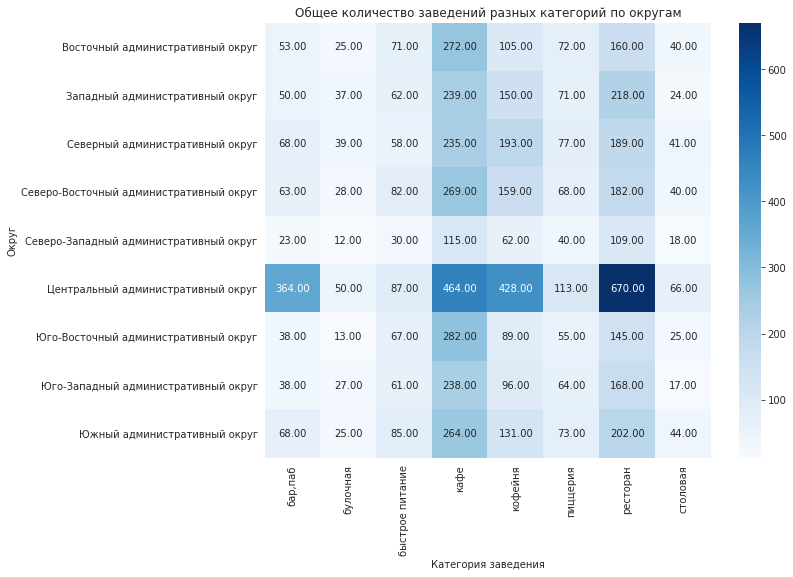

In [22]:
cat_distr_count = data.pivot_table(index='district',
                                   columns='category',
                                   values='name',
                                   aggfunc='count')

show_heatmap(cat_distr_count,
             'Общее количество заведений разных категорий по округам',
             'Категория заведения',
             'Округ')

Что касается общего количества заведений, больше всего их в категориях кафе и ресторанов, а территориально они наиболее многочисленны в центральном округе. Кофеен меньше всего в северо-западном округе, а больше всего в центральном. 

Интересно, что центральный округ отмечен большим количествм баров, по количеству сравимо с кафе и кофейнями, а в остальных округах - это одна из самых малочисленных категорий заведений.

### Распределение рейтингов

Посмотрим на распределение средних рейтингов по категориям заведений.

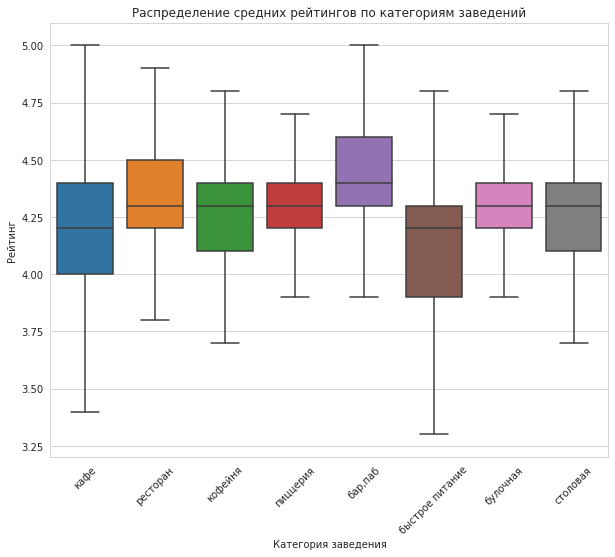

In [23]:
plt.figure(figsize=(10,8))
sns.boxplot(x='category', y='rating', data=data, showfliers=False)
plt.ylim(3.2,5.1)
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Рейтинг')
plt.xticks(rotation=45)
plt.show()

В целом оценки чаще всего колеблятся в районе 4-4.5 во всех категориях, в среднем немного чаще лучше оценивают бары, а хуже - точки быстрого питания, наибольший размах в оценках - у кафе. В остальном показатели примерно схожи по во всех категориях, судя по всему оценки заведений сильнее зависят не от категории заведения, а от других факторов.

Посмотрим, какие средние рейтинги заведений в зависимости от района. Также сразу добавим на карту кластеры с месторасположением заведений.

In [24]:
#таблица с рейтингами в округах
rating_district = data.groupby('district', as_index=False)['rating'].agg('mean')


#границы районов Москвы, широта и долгота Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

#Отрисовываем карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)


#Добавляем кластеры с заведениями
marker_cluster = MarkerCluster().add_to(m)
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)
    
data.apply(create_clusters, axis=1)

m

Как видим, в среднем лучше всего оценивают заведения в центральном округе, хуже всего - в юго-восточном.

### Топ-15 улиц

Найдём топ-15 улиц по количеству заведений.

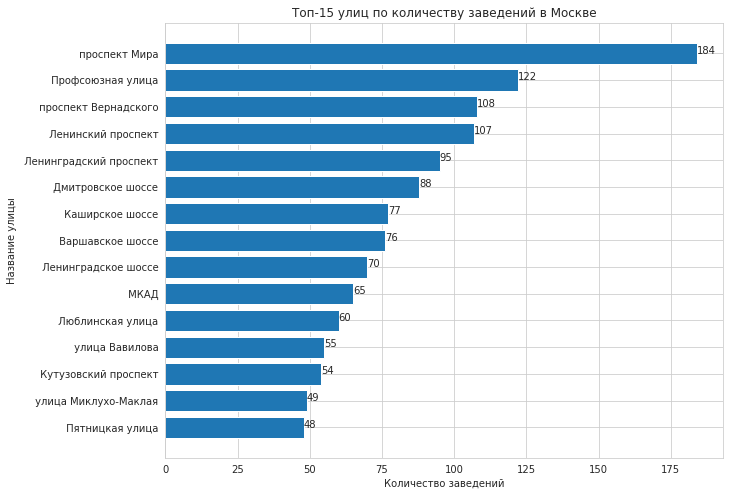

In [25]:
top_streets = pd.DataFrame(data.groupby('street')['name']
                          .count()
                          .sort_values(ascending=False)
                          .head(15)
                          .sort_values(ascending=True))
top_streets.columns=['count']

plt.figure(figsize=(10,8))
plt.barh(top_streets.index, top_streets['count'])
plt.title('Топ-15 улиц по количеству заведений в Москве')
plt.ylabel('Название улицы')
plt.xlabel('Количество заведений')

for index, value in enumerate(top_streets['count']):
    plt.text(value, index, str(value))
    
plt.show()

Построим график распределения количества заведений и их категорий по этим улицам.

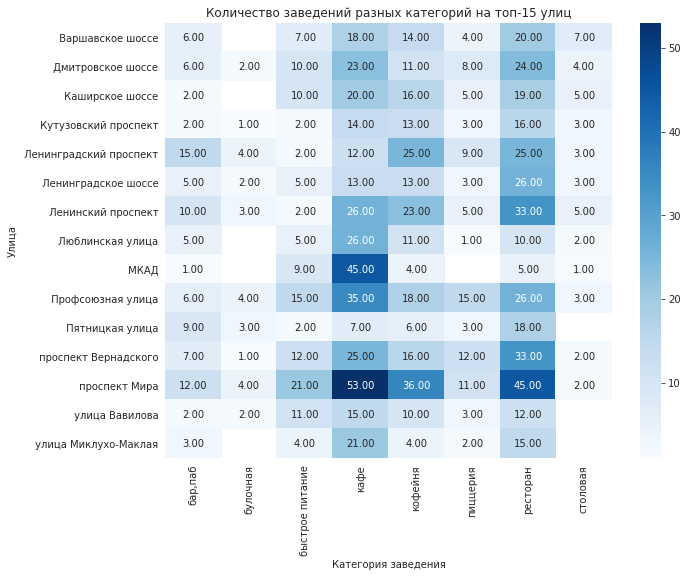

In [26]:
cat_distr_count = data.query('street in @top_streets.index').pivot_table(index='street',
                                   columns='category',
                                   values='name',
                                   aggfunc='count')

show_heatmap(cat_distr_count,
             'Количество заведений разных категорий на топ-15 улиц',
             'Категория заведения',
             'Улица')

На топ-15 улиц больше всего расположено кафе, ресторанов и кофеен, меньше всего булочных, пиццерий и столовых. 

Надо сказать, что в топ попали очень длинные улицы, такие как проспект Мира и Профсоюзная улица тянущиеся от кольца до МКАДа и даже сам МКАД, поэтому общее количество заведений на них не говорит о плотности их расположения, в то же время в топ-15 попала и небольшая Пятницкая улица, где действительно большая плотность заведений.

Попробуем найти улицы, где расположено только по одному заведению.

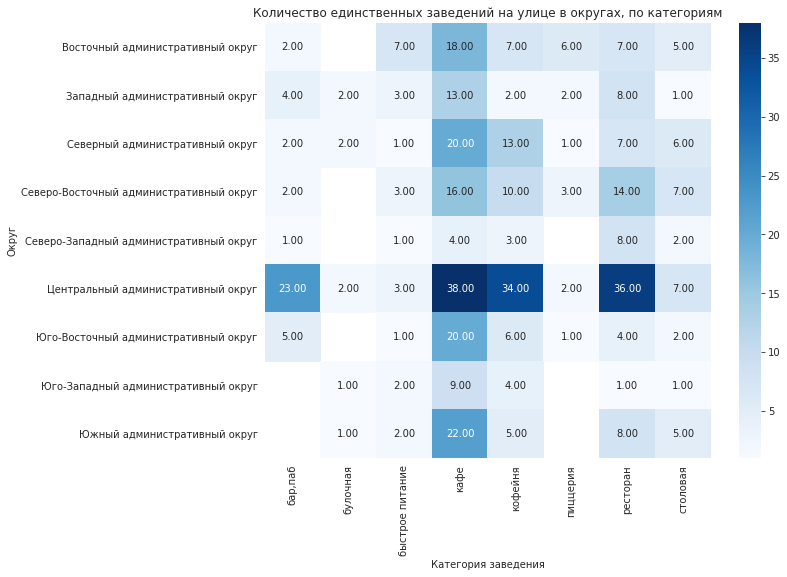

In [27]:
one_point_streets = data.groupby('street', as_index=False)['name'].count().query('name ==1')['street']

cat_distr_count = data.query('street in @one_point_streets').pivot_table(index='district',
                                   columns='category',
                                   values='name',
                                   aggfunc='count')

show_heatmap(cat_distr_count,
             'Количество единственных заведений на улице в округах, по категориям',
             'Категория заведения',
             'Округ')

Большинство таких улиц находится в центральном округе, что, по всей видимости, может говорить о том, что эти улицы небольшие. В этом округе на таких улицах в равной степени может оказаться ресторан, кофейня, кафе или, несколько реже, бар. 

Что касается других округов, наиболее часто на улицах, где находится всего одно заведение общепита, этим заведением окажется кафе. 

### Средний чек по округам

In [28]:
#таблица с рейтингами в округах
avg_bill_district = data.groupby('district', as_index=False)['middle_avg_bill'].agg('median')


#границы районов Москвы, широта и долгота Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

#Отрисовываем карту
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

Choropleth(
    geo_data=state_geo,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

m

Средний чек в центре и в западном округе самый дорогой, около 1000руб. Самые дешевые - не столь престижные южный, юго-восточный и северо-восточный округа, здесь чек может быть в два раза ниже, нежели в центре. В остальных округах средний чек колеблется в районе 700 руб.

### Часы работы заведений в зависимости от расположения и категории заведения

Посмотрим на процент заведений с ежедневным круглосуточным режимом работы в зависимости от расположения и категории заведения

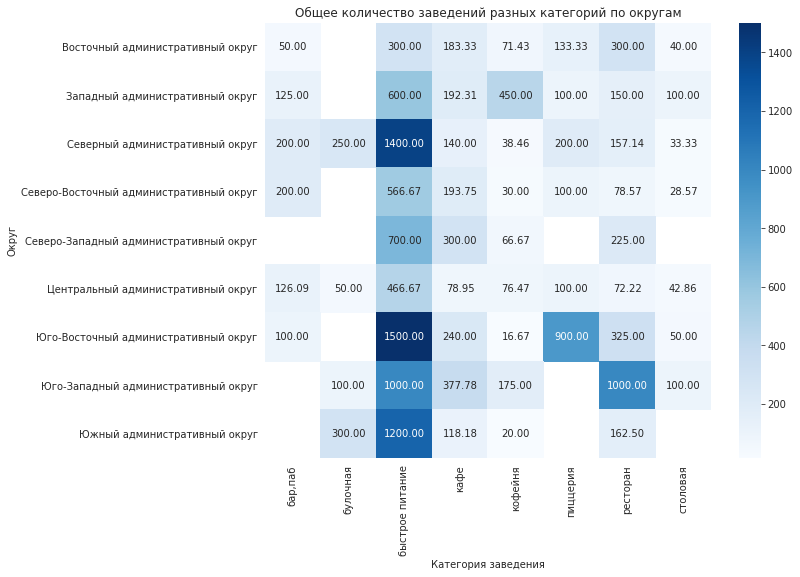

In [29]:
cat_distr_24_7 = data.query('is_24_7 == True').pivot_table(index='district',
                                   columns='category',
                                   values='name',
                                   aggfunc='count')

cat_distr_hours_perc = cat_distr_24_7 *100 / cat_distr_count

show_heatmap(cat_distr_hours_perc,
             'Общее количество заведений разных категорий по округам',
             'Категория заведения',
             'Округ',
             fmt='.2f')

Среди заведений быстрого питния более четверти - с ежедневным круглосуточным режимом работы, это самый высокий процент среди всех категорий. Кафе с таким режимом работы также встречаются, но реже - в среднем каждое десятое заведение, еслиречь не о центральном округе, где доля таких заведений только 6.47%.

В центральном округе заведения ежедневно и круглосуточно работают реже всего, а чаще всего - в Восточном округе. Как ни странно, здесь так работают четверть булочных.

### **Выводы по исследованию рынка общепита**

По категориям заведений и посадочным местам:
* Наиболее многочисленные категории заведений - кафе и рестораны (более 2000 заведений каждой категории), а также кофейни (почти 1500 заведений). Остальные категории уступают по численности как минимум в три раза. Столовых и булочных в Москве меньше всего - менее чем по 300 заведений.

* Бары, кофейни и  рестораны как правило обладают наибольшим количеством посадочных мест, медиана более 80 мест на заведение. Наименьшее количество посадочных мест у пиццерий и булочных, медианное значение посадочных мест около 50. 

По сетевым заведениям и распределению по округам:

* Почти две трети заведений - несетевые. Среди сетевых заведений наиболее распространены кафе, рестораны, и кофейни - вместе более трети от всех сетевых заведений, по 20-22% от всех сетевых. Пиццерии - 10% от сетевых заведений, быстрое питание - чуть более 7%

* В топ-15 сетевых заведений попали сети с количеством заведений выше 25, больше всего точек (120) у сети "Шоколадница". Топ-15 представлен больше всего в категориях кофеен, также ресторанов, пиццерий и кафе. Больше всего таких заведений в центральном округе.

* Что касается общего количества заведений, больше всего их также в центральном округе, и больше всего их в категориях кафе и ресторанов. Кофеен меньше всего в северо-западном округе, а больше всего в центральном. 

* Средний чек в центре и в западном округе самый дорогой, около 1000руб. Самые дешевые - не столь престижные южный, юго-восточный и северо-восточный округа, здесь чек может быть в два раза ниже, нежели в центре. В остальных округах средний чек колеблется в районе 700руб.

По рейтингу:

* Рейтинг чаще всего колеблятся в районе 4-4.5 во всех категориях, в среднем немного чаще лучше оценивают бары, а хуже - точки быстрого питания, наибольший размах в оценках - у кафе. В остальном показатели примерно схожи по во всех категориях, судя по всему оценки заведений сильнее зависят не от категории заведения, а от других факторов.

* В среднем наиболее рейтинговые заведения находятся в центральном округе, с худшим рейтингом - в юго-восточном.

По Топ-15 улицам:

* На топ-15 улиц больше всего расположено кафе, ресторанов и кофеен, меньше всего булочных, пиццерий и столовых. 

* В топ попали очень длинные улицы, такие как проспект Мира и Профсоюзная улица тянущиеся от кольца до МКАДа и в том числе попал сам МКАД, поэтому общее количество заведений на них не говорит о плотности их расположения, в то же время в топ-15 попала и небольшая Пятницкая улица, где действительно большая плотность заведений.

По улицам с одним заведением:

* Большинство таких улиц находится в центральном округе, что, по всей видимости, может говорить о том, что эти улицы небольшие. В этом округе на таких улицах в равной степени может оказаться ресторан, кофейня, кафе или, несколько реже, бар. 

* Что касается других округов, наиболее часто на улицах, где находится всего одно заведение общепита, этим заведением окажется кафе. 

По режиму работы:
* Среди заведений быстрого питния более четверти - с ежедневным круглосуточным режимом работы, это самый высокий процент среди всех категорий. Кафе с таким режимом работы также встречаются, но реже - в среднем каждое десятое заведение, еслиречь не о центральном округе, где доля таких заведений только 6.47%.
* В центральном округе заведения ежедневно и круглосуточно работают реже всего, а чаще всего - в Восточном округе. Как ни странно, здесь так работают четверть булочных.

## Анализ с целью сбора рекомендаций для открытия кофейни

### Число кофеен в Москве

Определим, сколько кофеен расположено в разных округах.

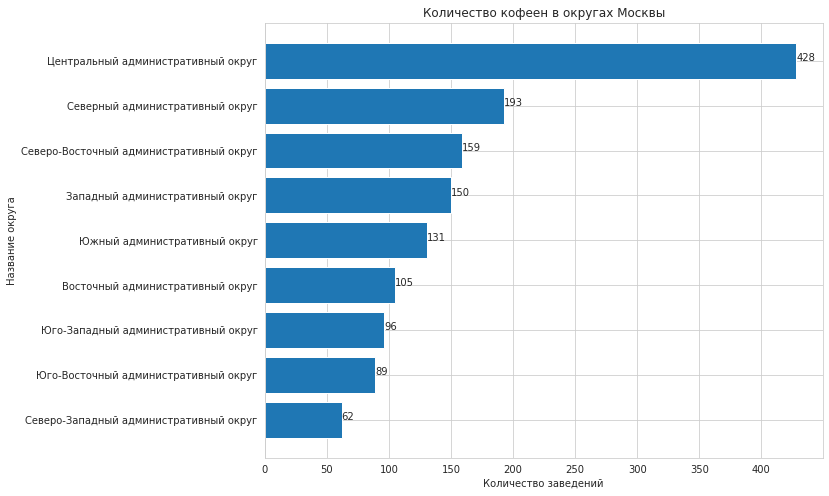

In [30]:
cof_district = data.query('category == "кофейня"').groupby('district', as_index=False)['name'].count().sort_values(by='name')

plt.figure(figsize=(10,8))
plt.barh(cof_district.district, cof_district.name)
plt.title('Количество кофеен в округах Москвы')
plt.ylabel('Название округа')
plt.xlabel('Количество заведений')

for index, value in enumerate(cof_district.name):
    plt.text(value, index, str(value))

plt.show()

Ожидаемо, больше всего кофеен в центральном округе, более 400 кофеен, что в два раза больше чем в любом другом округе.  

Меньше всего - в Северо-Западном, Юго-Восточном  и Юго-Западном, менее 100 кофеен.

В остальных округах от 100 до 200 кофеен. 

### Время работы кофеен

Посмотрим, какой процент кофеен работает ежедневно и круглосуточно.

In [31]:
fig_is_chain = go.Figure(data=[go.Pie(labels=['24/7', 'Остальные'], 
                                   values=[len(data.query('category == "кофейня" and is_24_7 == True')),
                                           len(data.query('category == "кофейня" and is_24_7 == False'))])])
fig_is_chain.update_layout(title='Соотношение кофеен с режимом работы 24/7 и остальных кофеен')
fig_is_chain.show() 

Лишь чуть более 4% кофеен работает в режиме 24/7.

### Рейтинг кофеен

Посмотрим на распределение рейтинга кофеен:

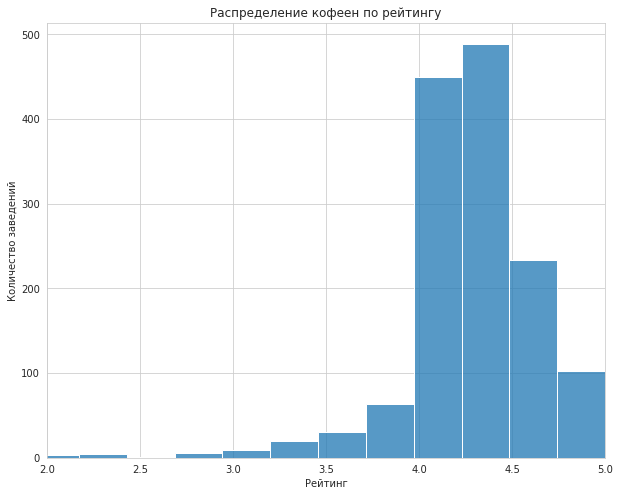

In [32]:
plt.figure(figsize=(10,8))
sns.histplot(data.query('category == "кофейня"')['rating'], bins=14)
plt.title('Распределение кофеен по рейтингу')
plt.ylabel('Количество заведений')
plt.xlabel('Рейтинг')
plt.xlim(2,5)
plt.show()


Наиболее распространённый рейтинг среди кофеен - от 4 до 4.5, чуть реже - выше 4.5.

Посмотрим на распределение рейтинга кофеен в зависимости от округа:

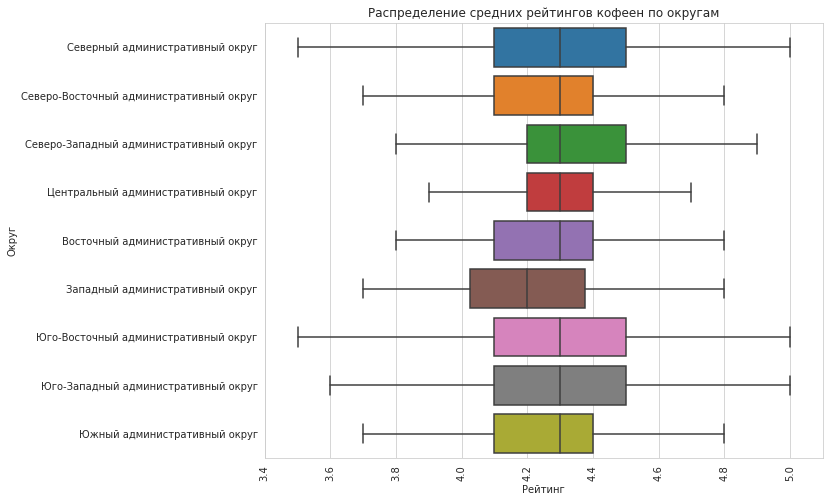

In [33]:
plt.figure(figsize=(10,8))
sns.boxplot(y='district', x='rating', data=data.query('category == "кофейня"'), showfliers=False)
plt.xlim(3.4,5.1)
plt.title('Распределение средних рейтингов кофеен по округам')
plt.ylabel('Округ')
plt.xlabel('Рейтинг')
plt.xticks(rotation=90)
plt.show()

Хуже всего оценивают кофейни в западном округе, шансы на высокую оценку выше в северном, северо-западном, юго-восточном и юго-западном округах.

### Орентировочная стоимость чашки капучино

Выведем распределение кофеен по средней цене чашки капучино:

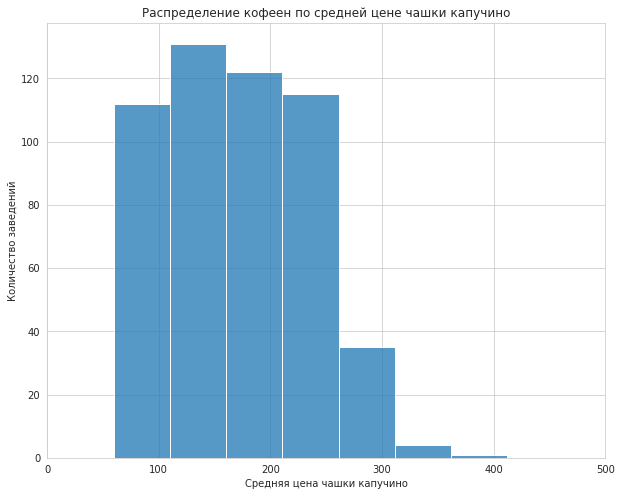

In [34]:
plt.figure(figsize=(10,8))
sns.histplot(data.query('category == "кофейня"')['middle_coffee_cup'], bins=30)
plt.title('Распределение кофеен по средней цене чашки капучино')
plt.ylabel('Количество заведений')
plt.xlabel('Средняя цена чашки капучино')
plt.xlim(0,500)
plt.show()


В большей части кофеен чашка капучино стоит от 100 до 250 рублей.

Посмотрим, как эта величина распределяется в зависимости от округа:

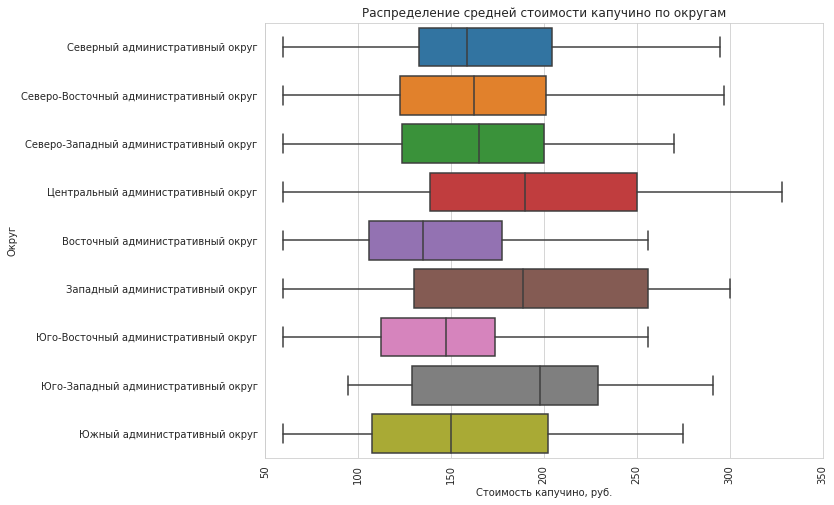

In [35]:
plt.figure(figsize=(10,8))
sns.boxplot(y='district', x='middle_coffee_cup', data=data.query('category == "кофейня"'), showfliers=False)
plt.xlim(50,350)
plt.title('Распределение средней стоимости капучино по округам')
plt.xlabel('Стоимость капучино, руб.')
plt.ylabel('Округ')
plt.xticks(rotation=90)
plt.show()

Самые низкие цены - в восточном и юго-восточном округах, самые высокие - в западном, юго-западном и центральном.

### Количество посадочных мест в кофейнях

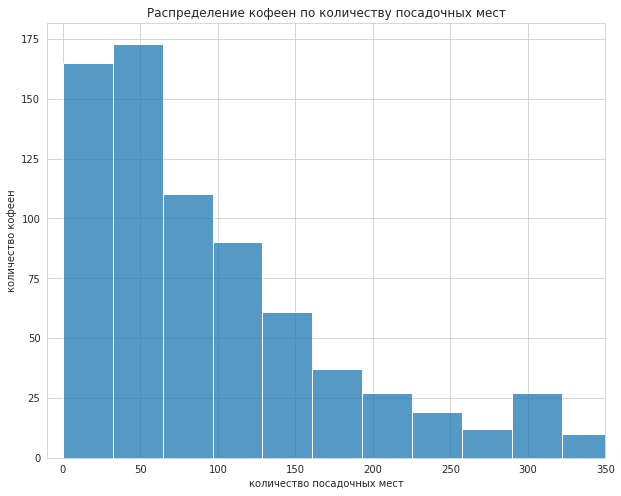

In [36]:
plt.figure(figsize=(10,8))
sns.histplot(data.query('category == "кофейня"')['seats'], bins=40)
plt.title('Распределение кофеен по количеству посадочных мест')
plt.xlabel('количество посадочных мест')
plt.ylabel('количество кофеен')
plt.xlim(-10,350)

plt.show()

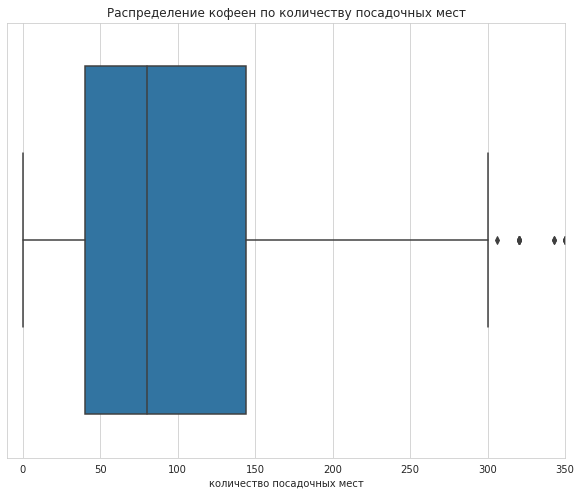

In [37]:
plt.figure(figsize=(10,8))
sns.boxplot(x=data.query('category == "кофейня"')['seats'])
plt.title('Распределение кофеен по количеству посадочных мест')
plt.xlabel('количество посадочных мест')
plt.xlim(-10,350)

plt.show()

Наиболее типичное количество мест для кофейни - от 40 до 140, медиана - 80.


### **Итоговые рекомендации**

По выбору округа:

* Самые высокие ценники у кофеен-конкурентов - в **западном**, **юго-западном** и **центральном округе**. Поскольку по условию хозяева кофейни хотят привлекать клиентов доступными ценами при высоком качестве, стоит обратить внимание на эти округа, где можно выгодно выделиться на фоне конкурентов, если, конечно, установить доступные цены позволят условия по арендной плате. Конечно, при установлении доступных цен лучше выбирать места с высокой проходимостью.

* Максимальное количество кофеен при этом - в **центральном** округе, что, видимо, обусловлено высоким спросом, однако здесь и максимальная конкуренция. **Западный** округ - средний по количеству уже имеющихся кофеен, и имеющиеся кофейни здесь имеют низкий рейтинг, минимальное число кофеен - в **юго-западном** округе, они с высоким рейтингом.

По количеству посадочных мест:
* Наиболее типичное количество посадочных мест для кофейни - от 40 до 140, медианное значение - 80 посадочных мест.

По стоимости чашки капучино:
* В большей части кофеен Москвы чашка капучино стоит от 100 до 250 рублей.
* Медианные цены за чашку капучино в **западнм**, **юго-западном** и **центральном** округах разнятся в районе 180-200 руб. В случае установления доступных цен можно ориентироваться на цену чашки чуть ниже медианных значений для этих округов на уровне 150-180руб.

По режиму работы:
* Только 4.18% кофеен работают в режиме 24/7

## Презентация

Презентация: https://disk.yandex.ru/i/34-plph9c_lMIg